In [1]:
#loading of the packages
import numpy as np
from scipy import ndimage
from scipy import signal
import scipy.misc
import imageio
import skimage.io
from skimage import morphology
from skimage import filters
from skimage import transform
from skimage import draw
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import os
import random
import pandas as pd
import sys
import time
import pickle
import importlib
import cv2
import pywt
import matplotlib.patches as patches
#custom packages
function_dir = os.path.join(os.pardir, 'Functions')
sys.path.append(function_dir)

import segmentation as seg
importlib.reload(seg) #to make sure the last version of seg is used


<module 'segmentation' from '..\\Functions\\segmentation.py'>

In [2]:
#loading of the images
#Data from Q:
data_base_path = os.path.join('Q:','Eco','dominic')

#data_base_path = os.path.join(os.pardir, 'Datasets')
#data_folder = os.path.join('Aquascope','raw_only')
data_folder = os.path.join('20211104_Greifensee_1','20211104_Greifensee_1_121')
data_path = os.path.join(data_base_path, data_folder)


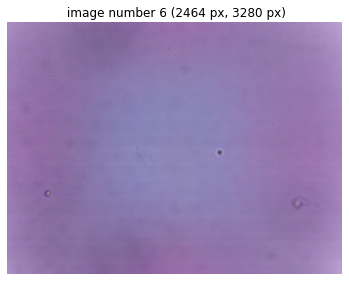

In [3]:
#test the validity of one random img
i = 6#change value to change img
img = skimage.io.imread(os.path.join(data_path, os.listdir(data_path)[i]))
im_h, im_w, im_channel = img.shape

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.imshow(img, cmap='gray')
ax.set_title(' image number '+str(i)+' ({} px, {} px)'.format(im_h, im_w))
ax.axis('off')
plt.show()


As most images contain mainly white parts, the first step is to select ROI. Here is the principle described for one image:

get the background by taking the mean of the dataset

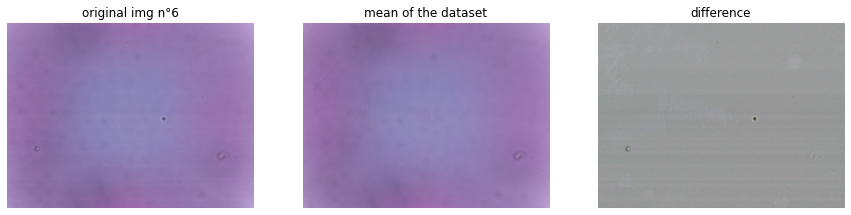

In [9]:
sum_img = np.zeros(img.shape)
hist_cum = np.zeros(256)
k=0
for file in os.listdir(data_path):
    try:
        img_k = skimage.io.imread(os.path.join(data_path,file))
        
    except:
        continue
    sum_img = img_k+sum_img
    hist,bins = np.histogram(img_k,256)
    hist_cum+=hist
    k+=1
    
mean_img = sum_img/k


fig, ax = plt.subplots(1, 3, figsize=(15, 18))

ax[0].imshow(img)
ax[0].set_title('original img n°'+str(i))
ax[0].axis('off')
ax[1].imshow(mean_img.astype(int))
ax[1].set_title('mean of the dataset')
ax[1].axis('off')
diff = img-mean_img
diff_rescale = (diff-np.min(diff))/(np.max(diff)-np.min(diff))
ax[2].imshow(diff_rescale)
ax[2].axis('off')
ax[2].set_title('difference')
plt.show()

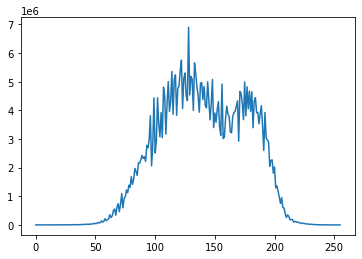

In [15]:
plt.plot(hist_cum)
threshold = filters.threshold_otsu(hist=hist_cum)/255


In [16]:
threshold 

0.5568627450980392

In [17]:
shrink_factor = 2
#threshold = 0.4 deprecated
dil_size = 6
min_area = 10
sigma = 5

the preprocessing took: 
 - 0.026880299999987756s to shrink the image
 - 0.048953400000016245s to process the high pass filter
 - 0.07709950000000276s to binarize it
 - 0.1852111999999977s to close it
 - 0.04939450000000534s to label it
 - 0.031728499999985615s to filter it 
 ----TOTAL: 0.4192673999999954


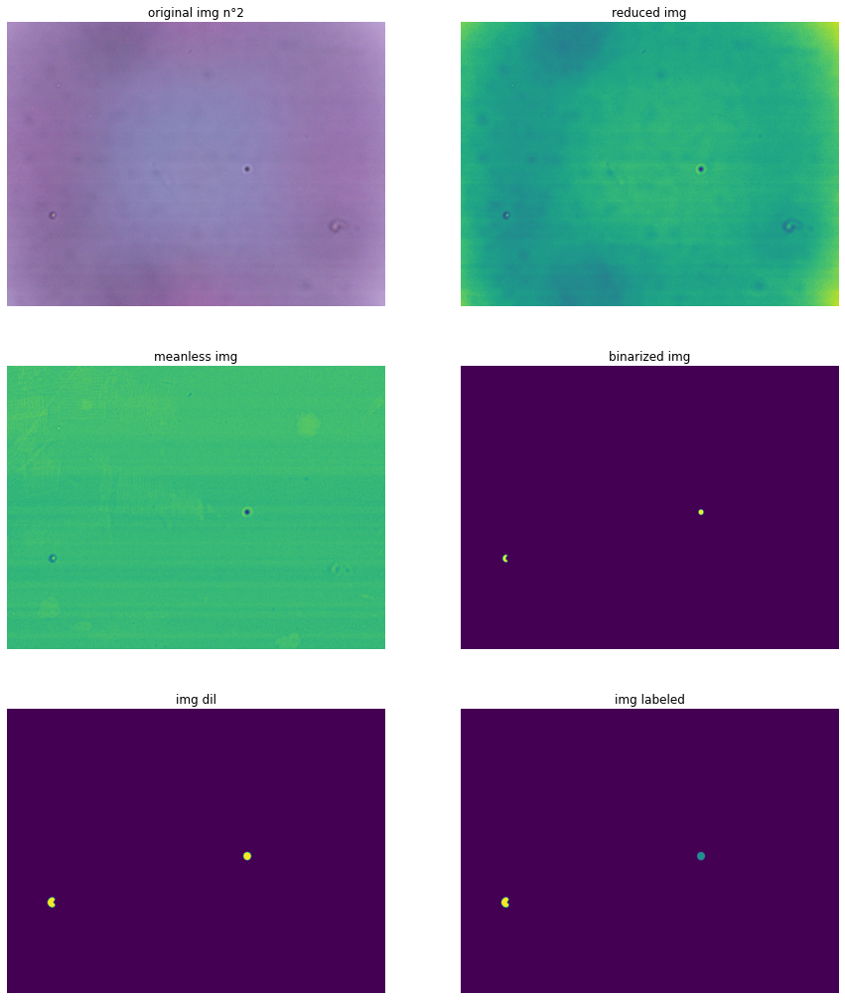

In [18]:
t0 = time.perf_counter()
#shrink the image to fasten the calculations, and turn it grey
img_small = np.sum(img[0::shrink_factor,0::shrink_factor],axis = 2)
t00 = time.perf_counter()
#substract the mean and renormalize:
diff = img_small-np.sum(mean_img[0::shrink_factor,0::shrink_factor],axis = 2)
diffn = (diff-np.min(diff))/(np.max(diff)-np.min(diff))
t1 = time.perf_counter()

#binarize
img_smooth = filters.gaussian(diffn,sigma)
threshold = threshold
img_bin = img_smooth < threshold

t3 = time.perf_counter()

#morphological op

img_dil = morphology.binary_dilation(img_bin,selem = morphology.disk(dil_size))
t4 = time.perf_counter()

#watershed
img_label, n_ROI = ndimage.label(img_dil.astype(int))
t5 = time.perf_counter()

#filter out the background
ids, count = np.unique(img_label,return_counts = True)
new_ids = np.zeros((ids[-1]+1), dtype = int)
j = 0
for i,c in zip(ids,count):
    if c != np.max(count):
            j = j+1
            new_ids[i]=j
#apply the filter:
if ids[-1]>1:
    img_filtered = new_ids[img_label[:,:]]
else:
    img_filtered = np.zeros(np.shape(img_label),dtype = int)
t6 = time.perf_counter()            


#print performances:
print('the preprocessing took: \n - '
     +str(t00-t0)+'s to shrink the image\n - '
     +str(t1-t00)+'s to process the high pass filter\n - '
     +str(t3-t1)+'s to binarize it\n - '
     +str(t4-t3)+'s to close it\n - '
     +str(t5-t4)+'s to label it\n - '
     +str(t6-t5)+'s to filter it \n ----TOTAL: '+str(t6-t0))

#plot
fig, ax = plt.subplots(3, 2, figsize=(15, 18))

ax[0,0].imshow(img)
ax[0,0].set_title('original img n°'+str(i))
ax[0,0].axis('off')

ax[0,1].set_title('reduced img')
ax[0,1].imshow(img_small)
ax[0,1].axis('off')

ax[1,0].set_title('meanless img')
ax[1,0].imshow(diffn)
ax[1,0].axis('off')

ax[1,1].set_title('binarized img')
ax[1,1].imshow(img_bin)
ax[1,1].axis('off')

ax[2,0].set_title('img dil')
ax[2,0].imshow(img_dil)
ax[2,0].axis('off')

ax[2,1].set_title('img labeled')
ax[2,1].imshow(img_filtered)
ax[2,1].axis('off')
plt.show()


In [19]:
dil_size_sharp = 15
threshold_sharp = 0.02

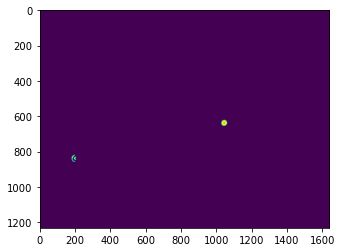

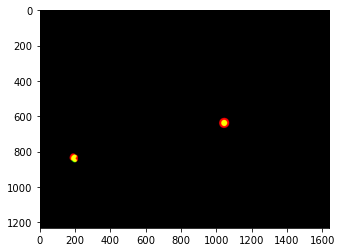

In [20]:
f1 = filters.sobel(img_smooth)
sharp = f1>threshold_sharp
sharp_ero = morphology.binary_erosion(sharp,selem=morphology.disk(3))
sharp_dil = morphology.binary_dilation(sharp_ero,selem = morphology.disk(dil_size_sharp))
sharp_label,n_sharp = ndimage.label(sharp_dil)


plt.imshow(sharp)
plt.show()

img_compound = np.zeros((img_smooth.shape[0],img_smooth.shape[1],3))
img_compound[:,:,0]=sharp_dil
img_compound[:,:,1]=img_dil
#img_compound[:,:,2]=np.logical_or(f1>0.03,img_dil)


plt.imshow(img_compound)
plt.show()

In [21]:
img_border = filters.sobel(img_small)
t1 = time.perf_counter()
threshold =0.3
#normalize the sobel filtered images
b_min = np.min(img_border)
b_max = np.max(img_border)
diff = b_max-b_min
img_bordern = (img_border-b_min)/diff
img_to_filter = np.copy(img_bordern)


img_bin_focus = img_bordern > threshold
img_close_focus = morphology.binary_dilation(img_bin_focus,selem = morphology.disk(dil_size))
np.putmask(img_to_filter, img_close_focus, 0)
img_bin_out = (img_to_filter > threshold/2)
img_close_out = morphology.binary_dilation(img_bin_out,selem = morphology.disk(dil_size))
np.putmask(img_to_filter, img_close_out, 0)
img_bin_veryout = (img_to_filter > threshold/4)
img_close_veryout = morphology.binary_dilation(img_bin_veryout,selem = morphology.disk(dil_size))


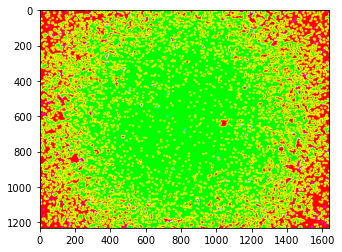

In [22]:
chanimg = np.zeros((img_close_focus.shape[0],img_close_focus.shape[1],3))
chanimg[:,:,0]=img_close_focus
chanimg[:,:,1]=img_close_out
chanimg[:,:,2]=img_close_veryout
plt.imshow(chanimg)

As the method above is not quite resilient, each ROI is treated separately to find how well it is focused

Once the images are correctly labeled, one can segment the wanted ROI and store them in a list

In [23]:
margin = 5
ROI_list = []
c_list =[]
ROI_sharp_list = []
c_sharp_list = []
for i in range(1,n_sharp+1):
    x,y = np.where(sharp_label ==i)
    xmin = 2*max(np.min(x)-margin,0)
    ymin = 2*max(np.min(y)-margin,0)
    xmax = 2*min(np.max(x)+margin,im_h//2)
    ymax = 2*min(np.max(y)+margin,im_w//2)
    c_sharp_list.append(((xmin,ymin),(xmax,ymax)))
    ROI_sharp_list.append(img[xmin:xmax,ymin:ymax])
for i in range(1,j+1):
    x,y = np.where(img_filtered ==i)
    xmin = 2*max(np.min(x)-margin,0)
    ymin = 2*max(np.min(y)-margin,0)
    xmax = 2*min(np.max(x)+margin,im_h//2)
    ymax = 2*min(np.max(y)+margin,im_w//2)
    flag = False
    for corners in c_sharp_list:
        if ((xmin-corners[0][0])**2+(ymin-corners[0][1])**2)<50*50 and (
            (xmax-corners[1][0])**2+(ymax-corners[1][1])**2)<50*50:
            flag = True
            break
    if not flag:
        c_list.append((xmin,ymin))
        ROI_list.append(img[xmin:xmax,ymin:ymax])

In [24]:
len(ROI_list)

0

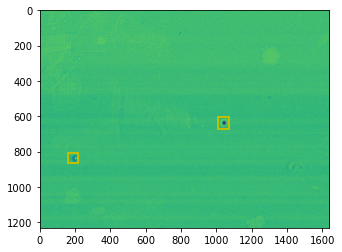

In [25]:
fig, ax = plt.subplots()
ax.imshow(diffn)
for i,ROI in enumerate(ROI_list):
    shape = ROI.shape
    rect = patches.Rectangle((c_list[i][1]//2,c_list[i][0]//2), shape[1]//2, shape[0]//2, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
for i,ROI in enumerate(ROI_sharp_list):
    shape = ROI.shape
    rect = patches.Rectangle((c_sharp_list[i][0][1]//2,c_sharp_list[i][0][0]//2), shape[1]//2, shape[0]//2, linewidth=2, edgecolor='y', facecolor='none')
    ax.add_patch(rect)

        
plt.show()

In [26]:
fig, ax = plt.subplots(len(ROI_list), figsize=(15, 50))
if len(ROI_list)>1:
    for i,ROI in enumerate(ROI_list): 
        ax[i].imshow(ROI)
        ax[i].set_title(str(i))
else:
    ax.imshow(ROI_list[0])
plt.show()
fig, ax = plt.subplots(len(ROI_sharp_list), figsize=(15, 50))
if len(ROI_sharp_list)>1:
    for i,ROI in enumerate(ROI_sharp_list): 
        ax[i].imshow(ROI)
        ax[i].set_title(str(i))
else:
    ax.imshow(ROI_sharp_list[0])

ValueError: Number of rows must be a positive integer, not 0

<Figure size 1080x3600 with 0 Axes>

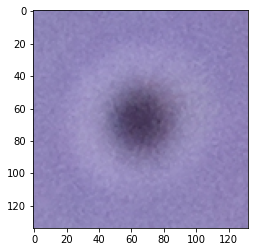

In [30]:
i = 0
ROI = ROI_sharp_list[i]
plt.imshow(ROI)

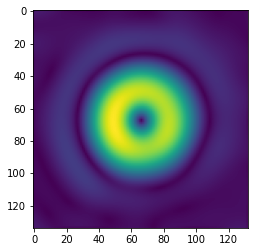

0.031002894658607037


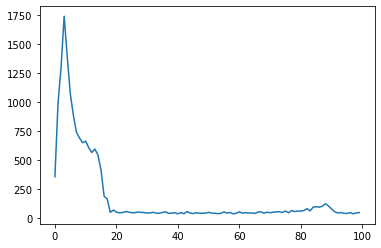

0.09010492507797294


NameError: name 'p' is not defined

In [31]:
#normalize the ROI, then filter it with a sobel kernel
ROIg = np.mean(ROI,axis=2)
ROIn = (ROIg-np.min(ROIg))/(np.max(ROIg)-np.min(ROIg))
gaussROI = filters.gaussian(ROIn,10)
sobelROI = filters.sobel(gaussROI)#ndimage.gaussian_laplace(ROIn,5)
hist,b = np.histogram(sobelROI,100)
plt.imshow(sobelROI)
plt.show()
plt.plot(hist)
print(b[-2])
plt.show()
p50,p99 = np.percentile(sobelROI,[50,99])
print(p50/p99)
plt.imshow(sobelROI>p)

In [32]:
def wavelethisto(ROI,pad=0,normalize=True):
    ROIg = np.mean(ROI,axis=2)
    #ROIn = (ROIg-np.min(ROIg))/(np.max(ROIg)-np.min(ROIg))
    coeffs = pywt.wavedec2(ROIg, 'haar',level=None)
    coeffs1, cslice,cshape = pywt.ravel_coeffs(coeffs, axes=None)
    histo = []
    for slicedim in cslice:
        if isinstance(slicedim,dict):
            totdim = 0
            for direction in ('ad','dd','da'):
                totdim+= np.percentile(np.abs(coeffs1[slicedim[direction]]),99)
        #else:
            #totdim = np.max(np.abs(coeffs1[slicedim]))
            histo.append(totdim)
    #histo = [el/histo[0] for el in histo[1:]]
    
    if normalize:
        histo_n = [el/(2**(len(histo)-i)) for i,el in enumerate(histo)]
        histo = histo_n
    if pad > 0:
        hist_pad = np.ones(pad)*histo[0]
        hist_pad[-1:-len(histo)-1:-1]=histo[-1::-1]
        return hist_pad
    else:
        return histo

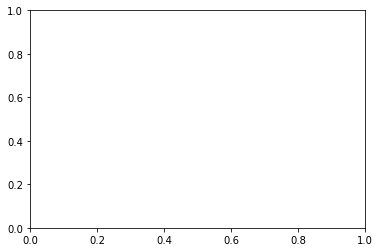

C:\Users\valla\AppData\Local\Temp/ipykernel_8972/2604979975.py:12: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(hist_a[4:,:])


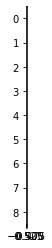

In [33]:
fig1 = plt.subplot()
#sample = [ROI_list[12],ROI_list[13],ROI_list[28],ROI_list[21]]
sample = ROI_list
pad = 13
hist_a = np.zeros(shape=(pad,len(sample)))
for i,ROI in enumerate(sample):
    hist = wavelethisto(ROI,pad = pad)
    fig1.plot(np.log(hist[4:]))
    hist_a[:,i]=np.log(hist)
    #fig1.legend([el for ])
plt.show()
plt.imshow(hist_a[4:,:])

On the image above, each ROI is represented in a column. The yellower the pixel the higher the coefficient is. If a ROI has a lot of high 

In [34]:
def takeSecond(elem,num_comp=0):
    return elem[1][num_comp]
tup = sorted(enumerate(hist_a.T),key=takeSecond)
idx = [el[0] for el in tup]

In [35]:
for i in idx[-1:-5:-1]:
    plt.imshow(ROI_list[i])
    plt.title(i)
    plt.show()

In [36]:
i = 37
ROI = ROI_list[i]
plt.imshow(ROI)
#plt.imshow(img_filtered==i+1)

IndexError: list index out of range

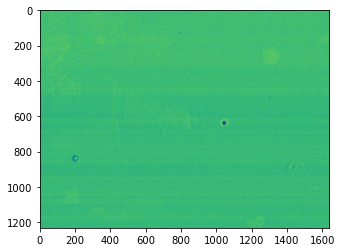

In [37]:
plt.imshow(diffn)

In [38]:
print(c_list[1])
print(ROI_list[1].shape)
plt.imshow(ROI_list[1])
plt.show()
plt.imshow(img_filtered==2)
plt.show()


IndexError: list index out of range

In [39]:
shape[:2]

(116, 114)

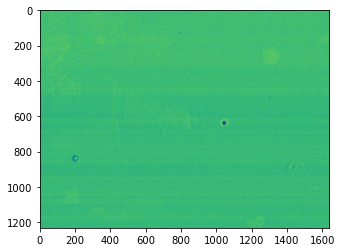

In [40]:
fig, ax = plt.subplots()
ax.imshow(diffn)
for i,ROI in enumerate(ROI_list):
    shape = ROI.shape
    if hist_a[-1,i]<hist_a[-4,i]:
        rect = patches.Rectangle((c_list[i][1]//2,c_list[i][0]//2), shape[1]//2, shape[0]//2, linewidth=2, edgecolor='r', facecolor='none')
    else:
        if np.min(shape[:2])>150:
            rect = patches.Rectangle((c_list[i][1]//2,c_list[i][0]//2), shape[1]//2, shape[0]//2, linewidth=2, edgecolor='y', facecolor='none')
    ax.add_patch(rect)

        
plt.show()

In [41]:
ROI = ROI_list[0]

IndexError: list index out of range

In [42]:
ROIg = np.mean(ROI,axis=2)
ROIn = (ROIg-np.min(ROIg))/(np.max(ROIg)-np.min(ROIg))
coeffs = pywt.wavedec2(ROIn, 'haar')
coeffs1, cslice,cshape = pywt.ravel_coeffs(coeffs, axes=None)

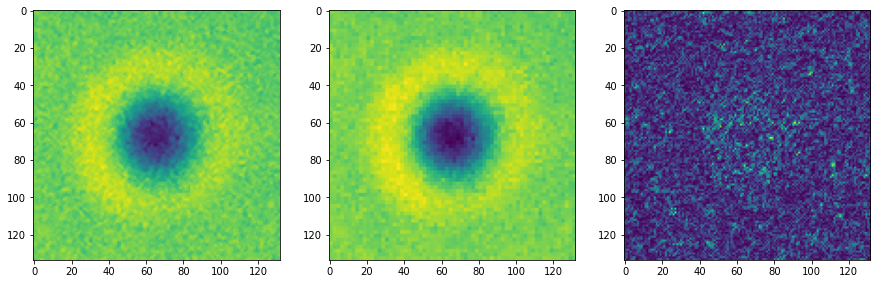

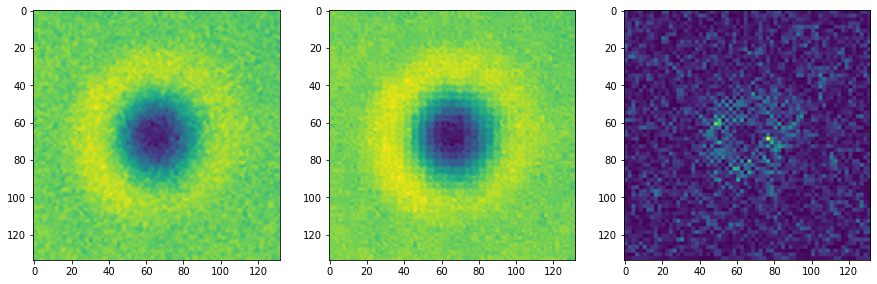

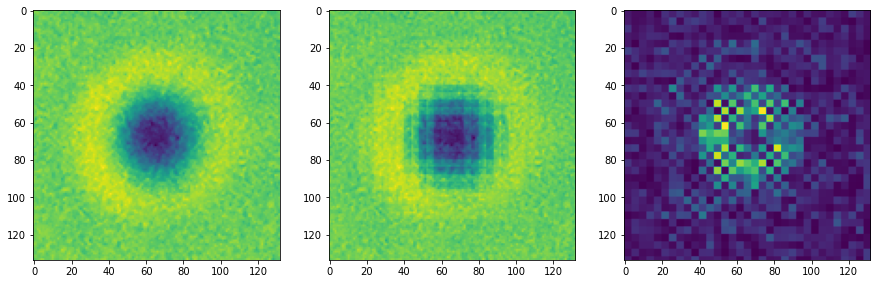

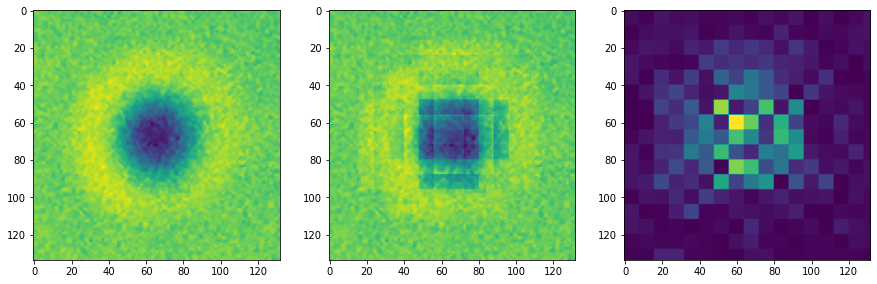

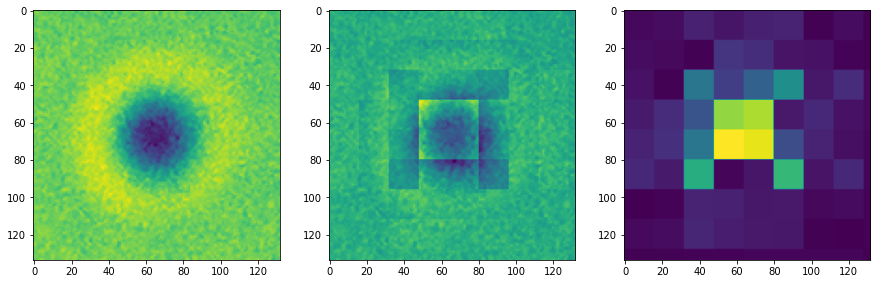

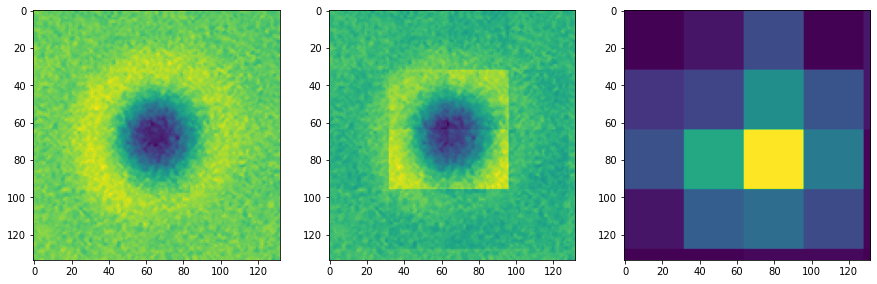

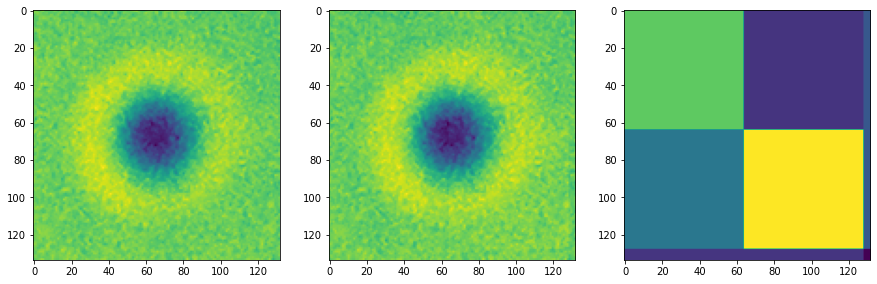

In [43]:
#build the image by removing a given coeff and comput the difference

for idx in cslice[-1:0:-1]:
        coeffs_new = np.copy(coeffs1)
        coeffs_new[idx['dd']] = 0
        coeffs_new[idx['ad']] = 0
        coeffs_new[idx['da']] = 0
        fig, ax = plt.subplots(1,3, figsize=(15, 5))
        img_rec = pywt.waverec2(pywt.unravel_coeffs(coeffs1,cslice,cshape,output_format='wavedec2'),'haar')
        img_filtered = pywt.waverec2(pywt.unravel_coeffs(coeffs_new,cslice,cshape,output_format='wavedec2'),'haar')
        img_diff = np.abs(img_rec-img_filtered)
        ax[0].imshow(img_rec)
        ax[1].imshow(img_filtered)
        ax[2].imshow(img_diff)
        plt.show()
        

In [44]:
coeffs[1]

(array([[ 0.96164173, -0.87816901],
        [ 0.        ,  0.        ]]),
 array([[1.83954665, 0.        ],
        [0.48978873, 0.        ]]),
 array([[-0.39363996,  0.        ],
        [ 0.        ,  0.        ]]))

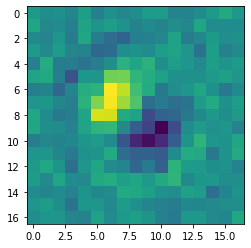

In [45]:
plt.imshow(np.sum(coeffs[5],axis=0))

In [46]:
#rec = pywt.idwt2((cA,(None,None,None)), 'haar')
rec = pywt.waverec2(coeffs, 'haar')

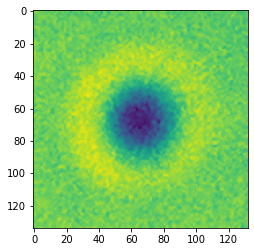

In [47]:
plt.imshow(rec)

The previously seen function have been integrated in segmentation.py file, allowing an easy reuse of them

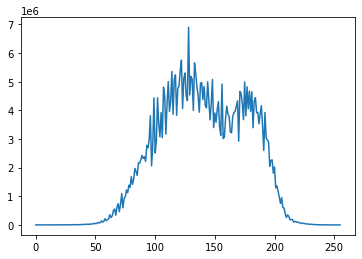

In [10]:
importlib.reload(seg) #to make sure the last version of seg is used
i = 1 #change value to change img
img_list = []
for img_name in os.listdir(data_path):
    try:
        img_list.append(skimage.io.imread(os.path.join(data_path,img_name)))
    except:
        continue   
img_arr = np.array(img_list)
mean_img,threshold = seg.stat_aquisition(img_arr)


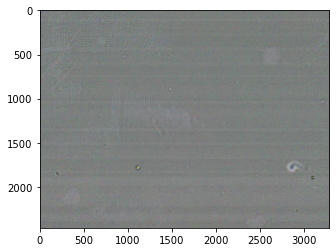

In [11]:
plt.imshow(seg.normalize(img-mean_img.astype(float)))

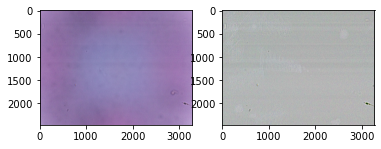

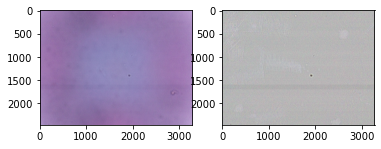

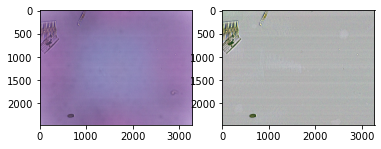

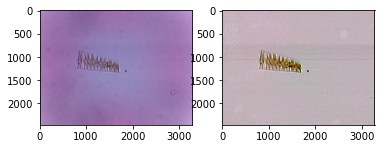

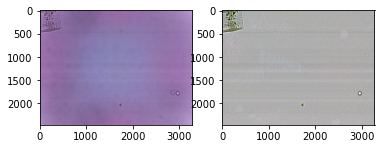

...

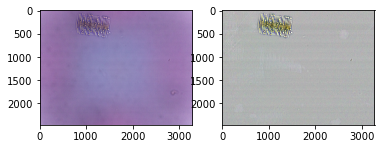

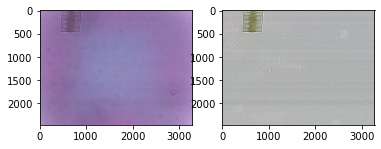

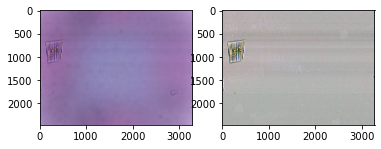

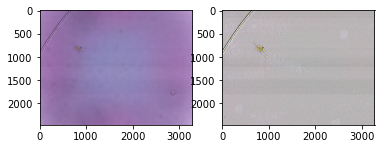

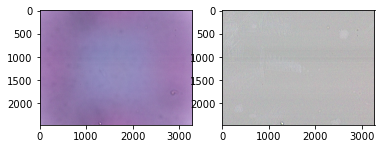

In [12]:
importlib.reload(seg) #to make sure the last version of seg is used

imgn_arr, threshold_aq = seg.standardize_aquisition(img_list,plot=True)

In [13]:
imgn_arr.shape

(20, 2464, 3280, 3)

In [14]:
threshold_aq

0.6953125

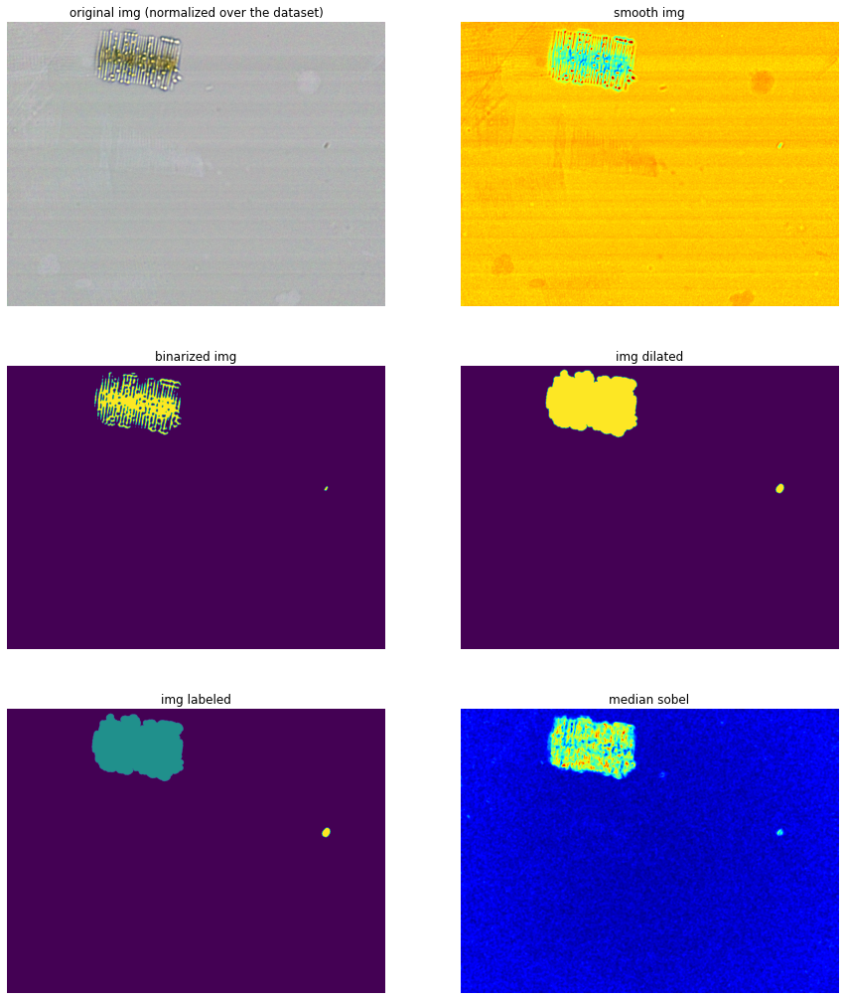

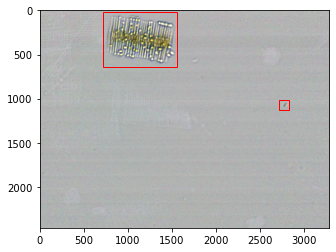

In [22]:
importlib.reload(seg) #to make sure the last version of seg is used

i = 15
img = imgn_arr[i]
img_label,c,c = seg.label_standard(img,threshold_aq-0.1,plot=True,return_features=True)
ROI_list = seg.segment(img, img_label,shrink_factor = 1,plot =True,margin = 20)


The preprocessing steps are used on all images, and several features are already stored:

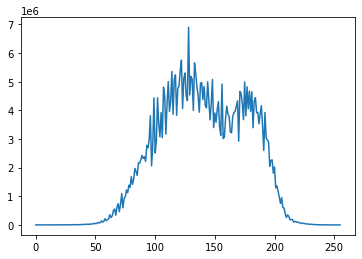

In [55]:
importlib.reload(seg) #to make sure the last version of seg is used

img_list = []
for img_name in os.listdir(data_path):
    try:
        img_list.append(skimage.io.imread(os.path.join(data_path,img_name)))
    except:
        continue
img_mean,threshold = seg.stat_aquisition(img_list)

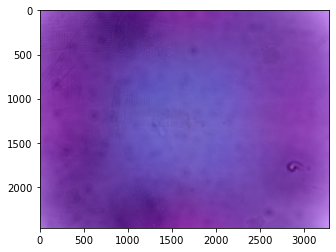

In [57]:
plt.imshow(seg.normalize(img_mean.astype(float)))

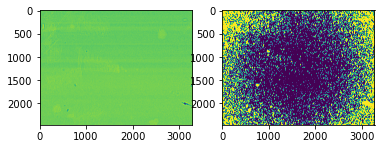

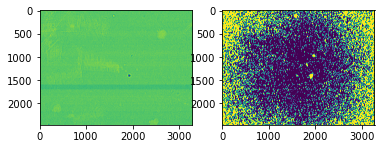

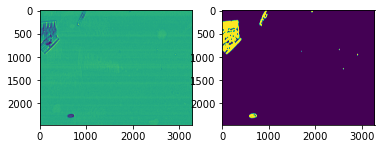

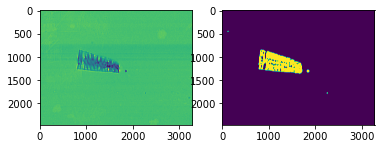

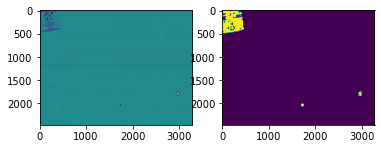

...

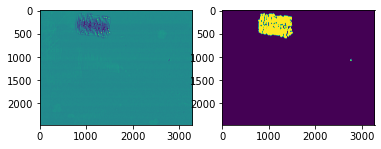

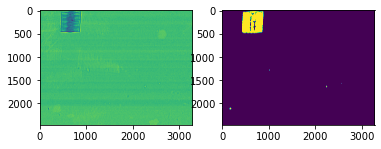

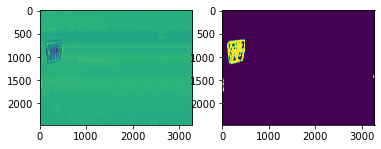

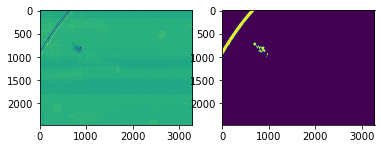

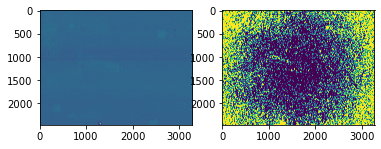

In [59]:
importlib.reload(seg) #to make sure the last version of seg is used

ROI_list = []
tl_list =[]

bundle_list = []
for i,img in enumerate(img_list):
    print(str(i+1)+'/'+str(len(img_list)),end='\r')
    img_label,img_median_sobel,img_smooth = seg.label_img_noBG(img.astype(float),img_mean,threshold,return_features=True)
    t = filters.threshold_otsu(img_median_sobel)
    fig,ax = plt.subplots(1,2)
    ax[0].imshow(img_smooth)
    ax[1].imshow(img_median_sobel>t)
    plt.show()
    #get the number of ROI and their sizes
    n, counts = np.unique(img_label,return_counts=True)
    counts = counts[1:]#get rid of the background
    margin = 20
    ROI_img,tl_img,mask_img = seg.segment(img, img_label,shrink_factor = 1,plot =False,
                                 return_tl=True, return_mask = True, margin = margin)
    ROI_meanless_img = seg.segment(img_smooth,img_label,shrink_factor=1,margin=margin)
    ROI_sobel_img = seg.segment(img_median_sobel,img_label,shrink_factor=1,margin=margin)
    
    for count,ROI,ROI_meanless,tl,mask,sobel in zip(counts,ROI_img,ROI_meanless_img,tl_img,mask_img,ROI_sobel_img):
        bundle = {}
        bundle['source img']=i
        bundle['ROI']=ROI
        bundle['ROI_meanless']=ROI_meanless
        bundle['area']=count
        bundle['position']=tl
        bundle['mask']= mask
        bundle['sobel']=sobel
        bundle_list.append(bundle)
    ROI_list.append(ROI_img)
    tl_list.append(tl_img)

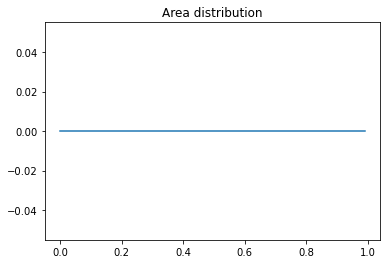

In [8]:
histo, bins = np.histogram([bundle['area'] for bundle in bundle_list],100)
fig = plt.subplot()
fig.plot(bins[:-1],histo)
fig.title.set_text('Area distribution')
#fig.set_xticks(range(len(bins)-1),bins[:-1], minor=False)

In [16]:
#preprocess the images:
t0 = time.perf_counter()
img_smooth = np.array([filters.gaussian(img) for img in img_arr])
imgn_arr, threshold_aq = seg.standardize_aquisition(img_arr,plot=False)
t1 = time.perf_counter()
print("Preprocessing time for the whole dataset: "+str(t1-t0)+"s")

C:\Users\valla\AppData\Local\Temp/ipykernel_13776/3169350462.py:3: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  img_smooth = np.array([filters.gaussian(img) for img in img_arr])


Preprocessing time for the whole dataset: 61.403132000006735s


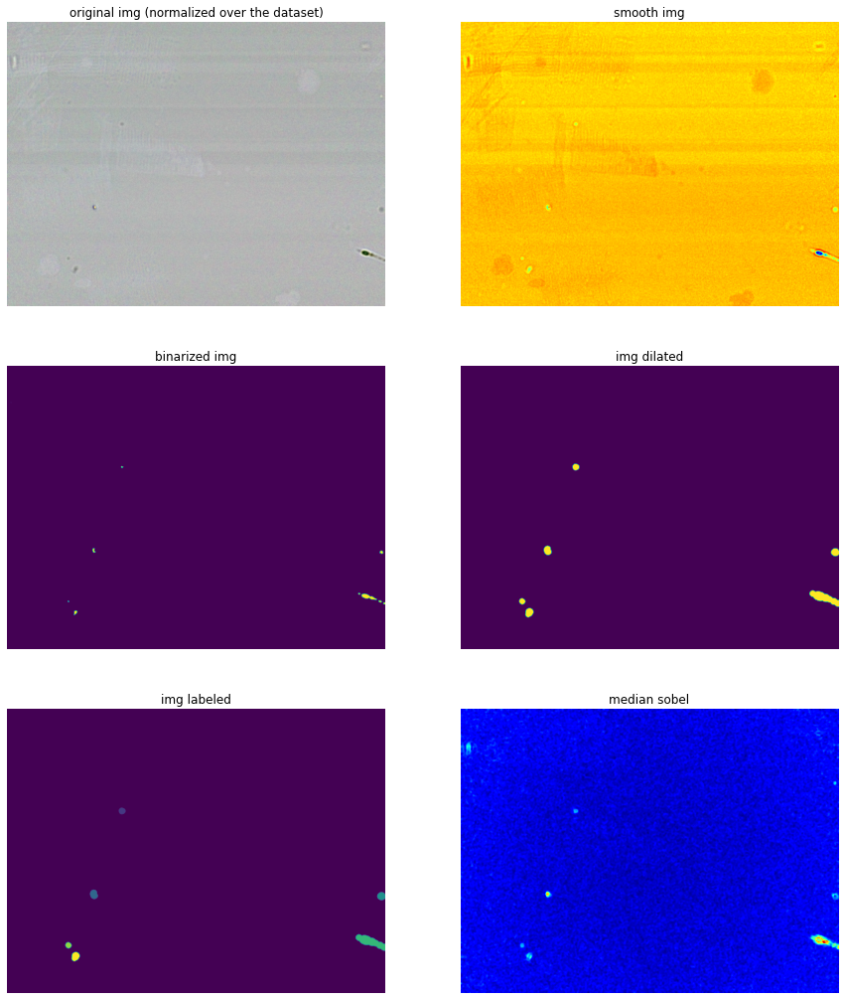

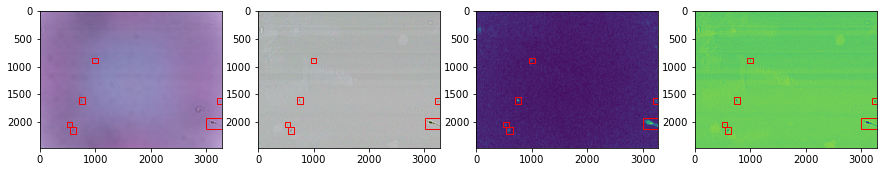

In [18]:
importlib.reload(seg) #to make sure the last version of seg is used

imgn = imgn_arr[0]
img = img_arr[0]
img_label,img_sobel,img_smooth = seg.label_standard(imgn,threshold_aq-0.1,plot=True,return_features=True)
ROI_mc = seg.multichannel_segment([img,imgn,img_sobel,img_smooth], img_label,plot =True,margin = 20)

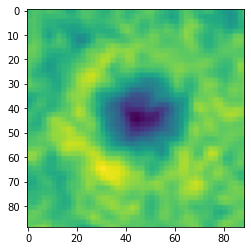

In [230]:
plt.imshow(ROI_mc[0][3])


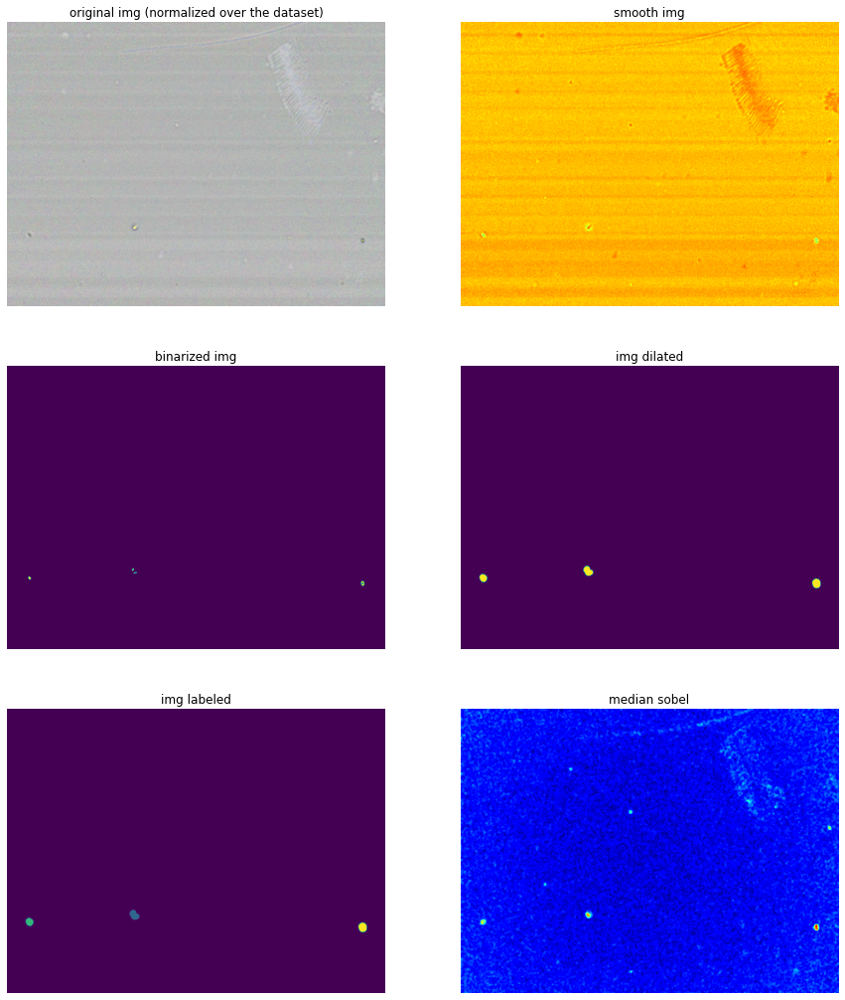

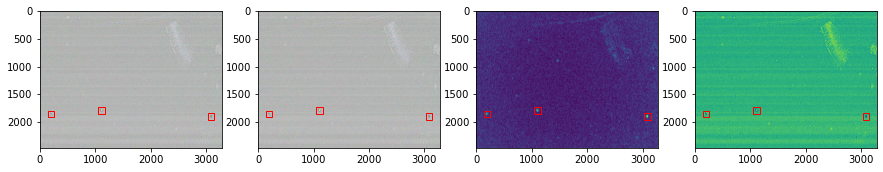

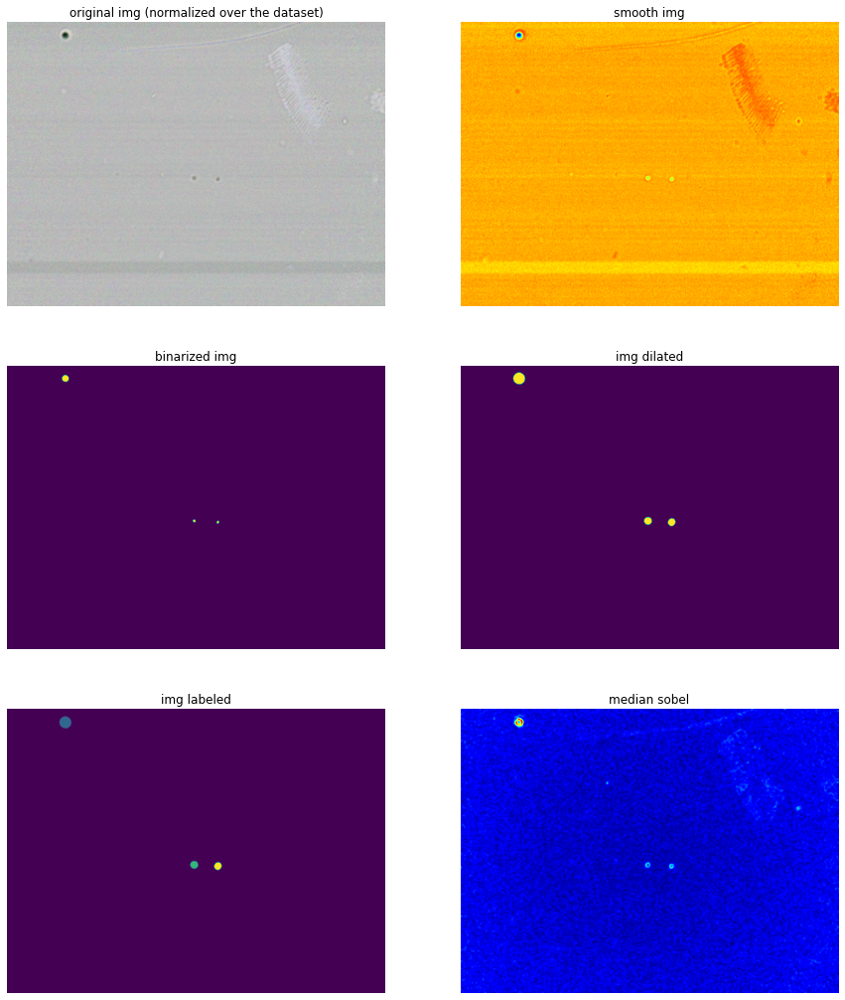

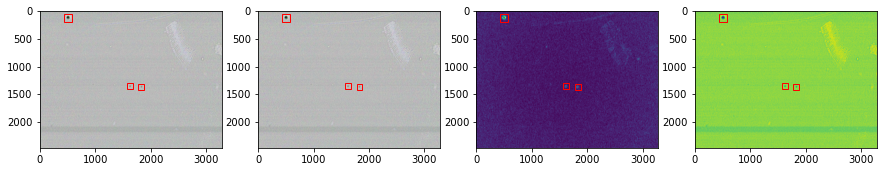

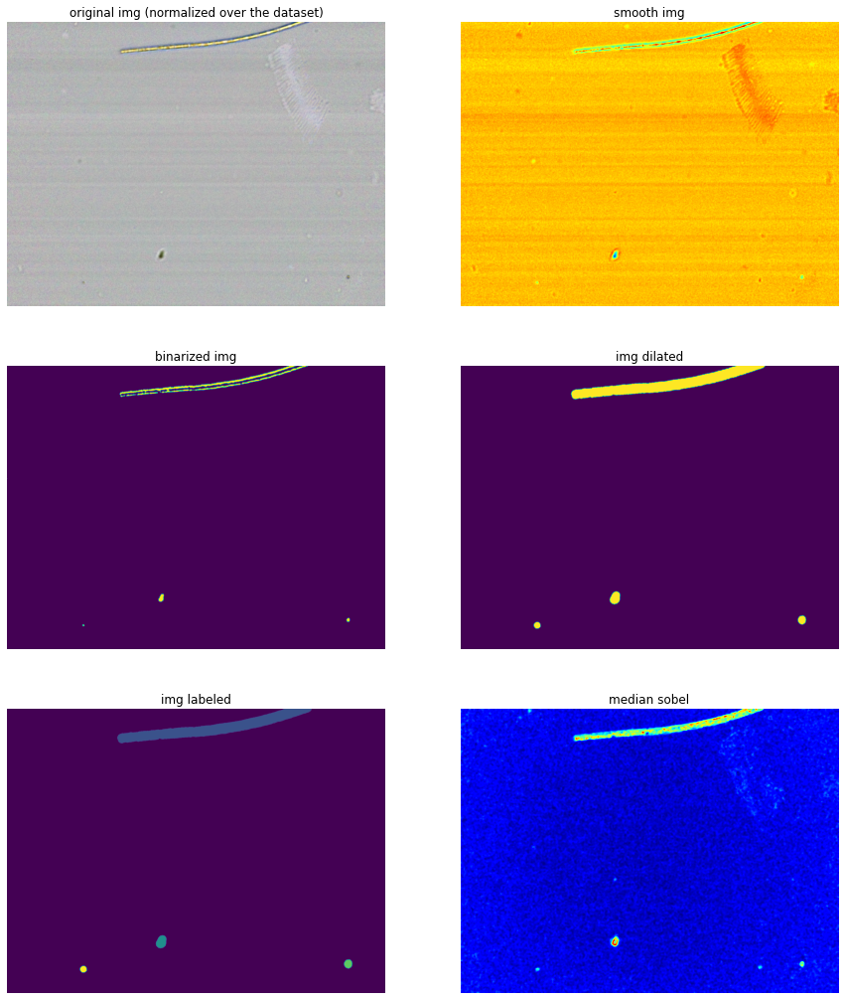

...

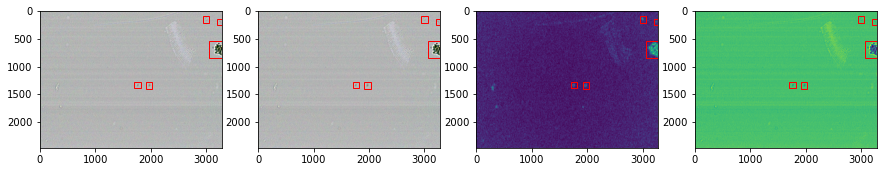

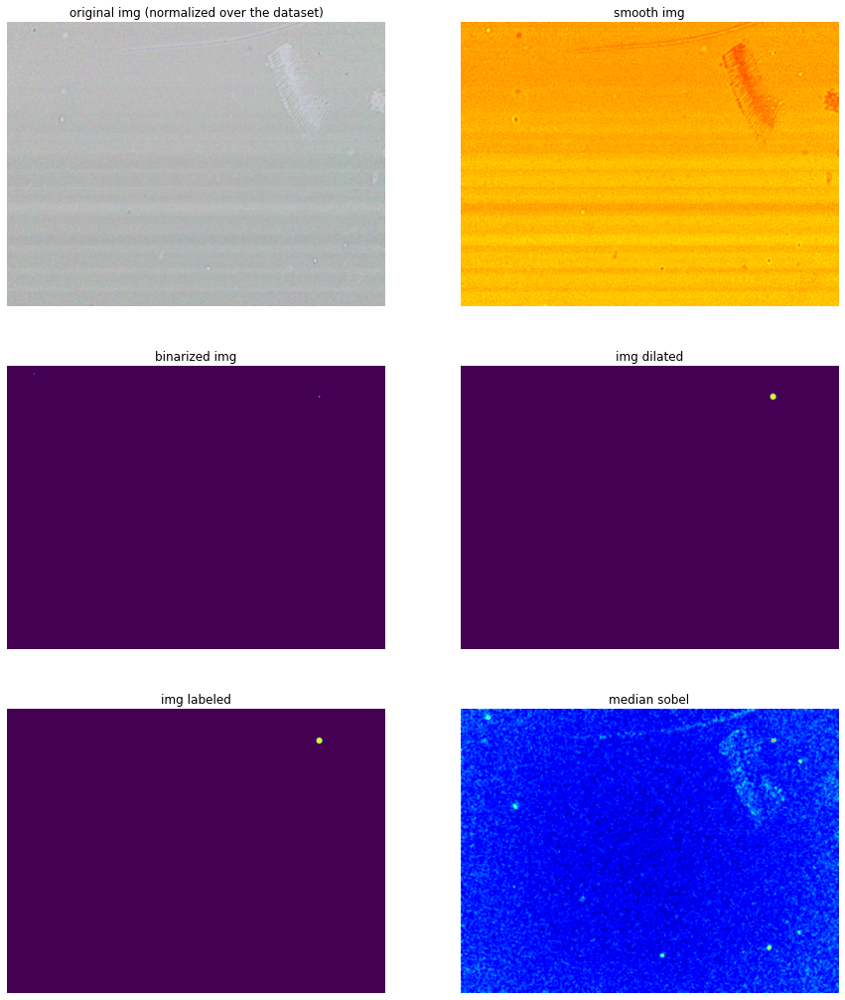

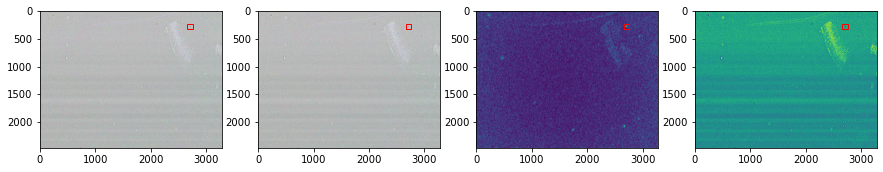

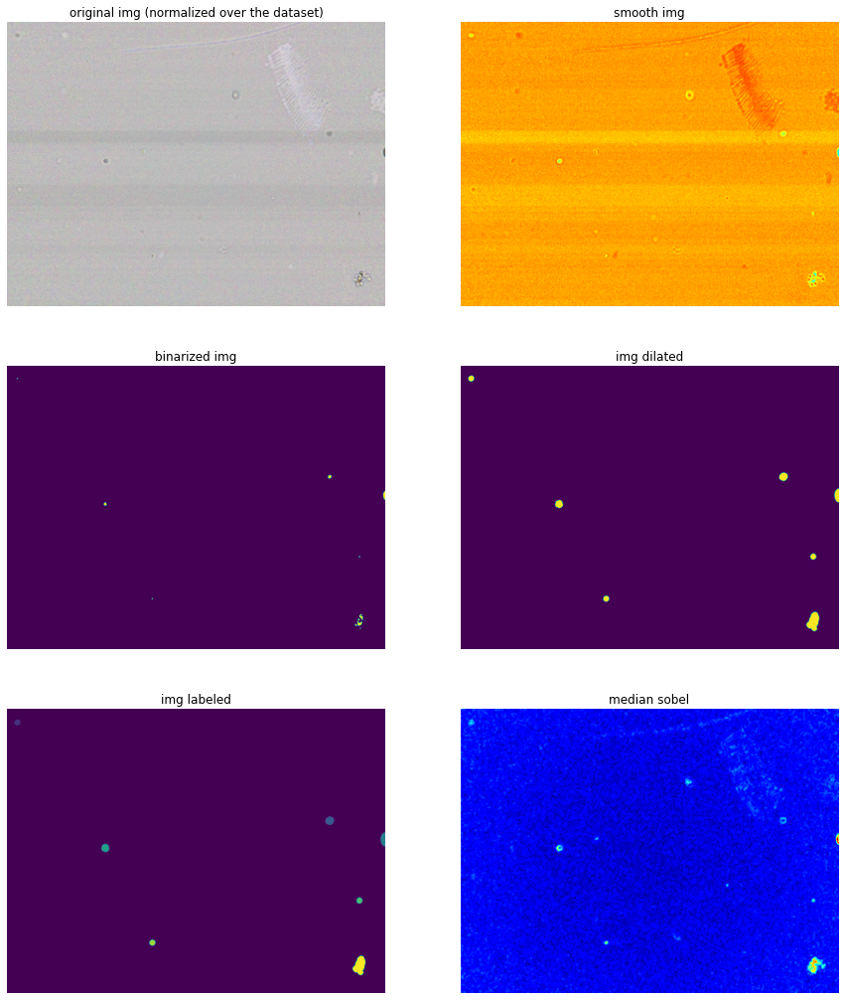

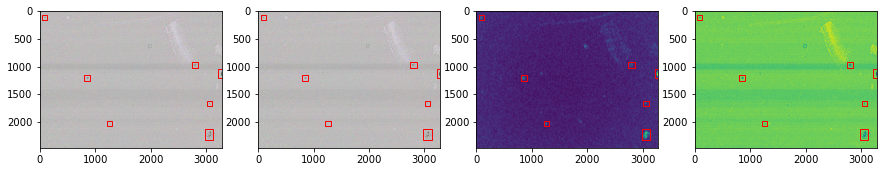

In [15]:
importlib.reload(seg) #to make sure the last version of seg is used

ROI_list = []
tl_list =[]

bundle_list = []
for i,(imgn,img) in enumerate(zip(imgn_list,img_list)):
    
    print(str(i+1)+'/'+str(len(imgn_list)),end='\r')
    img = imgn_list[i]
    img_label,img_sobel,img_smooth = seg.label_standard(imgn,threshold_aq-0.1,plot=True,return_features=True)
    ROI_mc = seg.multichannel_segment([img,imgn,img_sobel,img_smooth], img_label,plot =True,margin = 20)


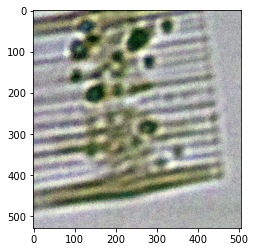

In [215]:
plt.imshow(ROI_mc[0][0])

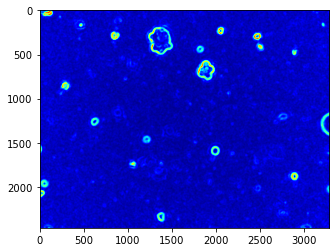

In [275]:
#test = filters.gaussian(diffn)
#test = seg.normalize(np.sum(bundle_list[92]['img_meanless'],axis=2))
#test = filters.sobel(bundle_list[92]['ROI_meanless'])
test = img_median_sobel
plt.imshow(test,cmap='jet')


In [216]:
from skimage.filters.rank import entropy,gradient,otsu,median,autolevel
from skimage.filters import threshold_otsu
from skimage.morphology import ball,disk



In [278]:
np.unique(test)

array([  5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,
        18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,  29,  30,
        31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,
        44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,
        57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
        70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,
        83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,
        96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108,
       109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121,
       122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134,
       135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147,
       148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160,
       161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173,
       174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 18

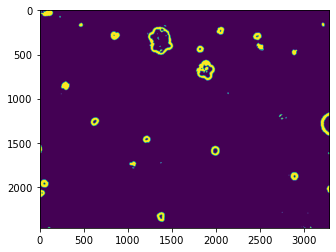

In [280]:


plt.show()

## File scraping
Takes all datasets in a parent file, and compute their ROI:

In [4]:
#Data from Q:
data_base_path = os.path.join('Q:','Eco','dominic')
data_folders = [os.path.join(data_base_path,folder) for folder in os.listdir(data_base_path)]
aquisitions_path = []
for folder in data_folders:
    aquisitions_path += [os.path.join(folder,aq) for aq in os.listdir(folder)]
print("TOTAL: "+str(len(aquisitions_path))+" different aquisitions")

TOTAL: 23 different aquisitions


In [5]:
#store the cropped images in Q:
crop_base_path = os.path.join('Q:','Eco','Gabriel')
def copy_leaves_path(new_base, old_base):
    new_paths = []
    #copy the architecture of the data path
    try:
        os.listdir(new_base)
    except OSError as error : 
        os.mkdir(new_base)
        
    for folder in os.listdir(old_base):
        folder_path = os.path.join(new_base,folder)
        leaves = os.listdir(os.path.join(old_base,folder))
        #create the parent folders if needed:
        try:
            os.listdir(folder_path)
        except OSError as error : 
            os.mkdir(folder_path)
        
        for leave in leaves:
            new_paths += [os.path.join(folder_path,leave)]
        for path in new_paths:
            try:
                os.listdir(path)
            except OSError as error : 
                os.mkdir(path)
    return new_paths
jpeg_base_path = os.path.join('Q:','Eco','Gabriel','png')
jpeg_paths = copy_leaves_path(jpeg_base_path, data_base_path)
print("TOTAL: "+str(len(jpeg_paths))+" different aquisitions")

TOTAL: 23 different aquisitions


In [6]:
jpeg_paths

['Q:Eco\\Gabriel\\png\\20211101_pond2_1\\20211101_pond2_1_113',
 'Q:Eco\\Gabriel\\png\\20211101_pond2_1\\20211101_pond2_1_114',
 'Q:Eco\\Gabriel\\png\\20211102_planktothrix_1\\20211102_planktothrix_1_119',
 'Q:Eco\\Gabriel\\png\\20211102_planktothrix_1\\20211102_planktothrix_1_120',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_121',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_122',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_123',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_124',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_125',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_126',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_127',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_128',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_129',
 'Q:Eco\\Gabriel\\png\\20211104_Greifensee_1\\2021

In [8]:
# as an example, the croped images will simply be saved in another directory, without any more features to save
# disk space
importlib.reload(seg) #to make sure the last version of seg is used
img_list = []
for i, (data_dir,crop_dir) in enumerate(zip(aquisitions_path,jpeg_paths)):
    if i < 2:
        continue
    #list all images in directory:
    
    for img_name in os.listdir(data_dir):
        try:
            img_list.append(skimage.io.imread(os.path.join(data_dir,img_name)))
        except:
            continue  
    #preprocess the images
    img_arr = np.array(img_list)
    img_list = []
    t0 = time.perf_counter()
    imgn_list, threshold_aq = seg.standardize_aquisition(img_arr,plot=False)
    t1 = time.perf_counter()
    print("Preprocessing time for the whole dataset n°"+str(i)+": "+str(t1-t0)+"s")
    for j,(imgn,img) in enumerate(zip(imgn_list,img_arr)):
    
        print(str(j+1)+'/'+str(imgn_list.shape[0]),end='\r')
        img_label,img_sobel,img_smooth = seg.label_standard(imgn,threshold_aq-0.1,plot=False,return_features=True)
        ROI_mc = seg.multichannel_segment([img,imgn,img_sobel,img_smooth], img_label,plot =False,margin = 20)
        for k,ROI in enumerate(ROI_mc):
            ROIimg = ROI[0]
            imageio.imwrite(os.path.join(crop_dir,'IMG_'+str(j)+'_ROI_'+str(k)+'.png'), ROIimg)

Preprocessing time for the whole dataset n°2: 16.820885299999986s
Preprocessing time for the whole dataset n°3: 34.127034699999996s
Preprocessing time for the whole dataset n°4: 33.25431020000002s
Preprocessing time for the whole dataset n°5: 35.596684700000026s
Preprocessing time for the whole dataset n°6: 35.45304220000003s
Preprocessing time for the whole dataset n°7: 33.220463400000085s
Preprocessing time for the whole dataset n°8: 202.74494320000008s
Preprocessing time for the whole dataset n°9: 16.640678799999932s
Preprocessing time for the whole dataset n°10: 16.25296800000001s
Preprocessing time for the whole dataset n°11: 28.101921099994797s


FileNotFoundError: The directory 'Q:\\Eco\\Gabriel\\png\\20211104_Greifensee_1\\20211104_Greifensee_1_128' does not exist

In [134]:
ROI = ROI_mc[0][0]

In [142]:
os.mkdir(jpeg_base_path)

FileNotFoundError: The directory 'Q:\\Eco\\Gabriel\\jpeg' does not exist

In [133]:
len(ROI_mc[0])

36

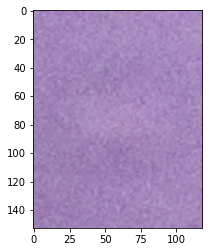

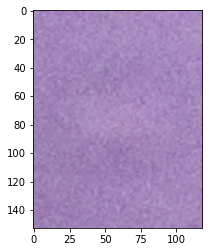

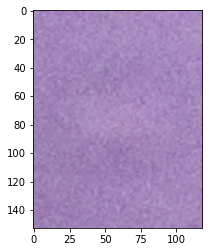

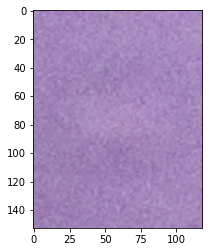

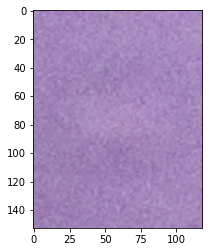

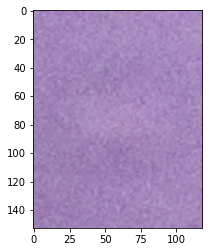

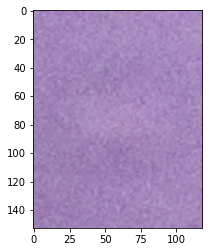

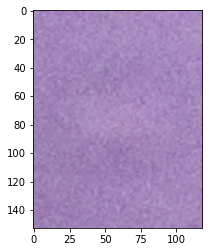

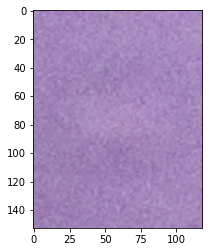

In [130]:
for ROI in ROI_mc:
    plt.imshow(ROI[0],vmin=0,vmax=1)
    plt.show()

## Post processing:
As a first set of feature is extracted in order to easily filter the ROI: The area and the sharpness (quantified by the 95th percentile of the sobel filtered image)

In [ ]:
#When more than one object is in the ROI, with one on the background and one in the foreground,
#it is interesting to brake it down:

In [135]:
ROI.dtype

dtype('uint8')

The list of ROI is saved in order not to recompute the segmentation too often

In [10]:
pickle_folder = os.path.join('PMID2019', 'pickle_ROI')
pickle_path = os.path.join(data_base_path, pickle_folder)

In [13]:
save_file = 'ROI_list404.pickle'

with open(os.path.join(pickle_path,save_file), 'wb') as f:
    pickle.dump(ROI_list, f)

In [11]:
with open(os.path.join(pickle_path,'ROI_list2.pickle'),'rb') as f:
    ROI_list = pickle.load(f)

In [12]:
len(ROI_list)

12392

In [29]:
BigROI_list = []
for ROI in ROI_list:
    if np.min(ROI.shape[0:-1])>512:
        BigROI_list.append(ROI)

In [30]:
len(BigROI_list)

2201

In [31]:
np.min(ROI.shape[0:2])

392

In [32]:
ROI.shape

(450, 392, 3)

In [35]:

for el in BigROI_list:
    if(np.min(el.shape[:-1])<256):
        print(el.shape)

In [36]:
save_file = 'BigROI_list404.pickle'

with open(os.path.join(pickle_path,save_file), 'wb') as f:
    pickle.dump(BigROI_list, f)